# Digitalisierung

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Was ist der Unterschied zwischen analogen und digitalen Daten? (Digi4All)

<iframe width="200" height="113" src="https://www.youtube.com/embed/IZUcqFCsKnA?si=6him2gazJymEJCJQ" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

Digitalisierung bezieht sich auf die Darstellung von Daten in einer Form, die von Computern gespeichert, verarbeitet und übertragen werden kann. Im Gegensatz zu analogen Messgeräten, bei denen die Darstellung lückenlos und daher unendlich genau ist, werden Daten in der digitalen Darstellung diskret und unter Verwendung eines begrenzten Zeichenvorrats dargestellt. Bei der Umwandlung von analogen in digitale Werte kann es daher zu Informationsverlusten kommen.

Viele Messungen, wie beispielsweise Spannungs- und Strommessungen, werden am Ende mittels Analog-Digital-Umsetzer (ADU) digitalisiert, da sie anders vom Computer nicht weiter verarbeitet werden können. Daher möchten wir hier das Grundprinzip des ADUs erläutern.

## Kennlinie

Im Zuge der Digitalisierung wird der unendliche Wertebereich einer analogen Größe, wie z.B. einer elektrischen Spannung, auf einen endlichen, diskreten **Wertebereich** abgebildet:

$$W_B = (2^n-1) \cdot 1\,\mathrm{LSB}$$

![Kennlinie bei der Digitalisierung unter Verwendung eines 3-Bit-ADU](draw/digi_3bit.jpg)

Die kontinuierliche analoge Spannung wird in viele kleine Stufen unterteilt. Die gestufte **(Treppen-)Kurve** in der obigen Abbildung zeigt die reale Übertragungskurve eines 3-Bit-Analog-Digital-Umsetzers (ADU). Das digitale Ausgangssignal bleibt konstant bei einem festen Wert, solange sich das analoge Eingangssignal innerhalb eines Inkrements, also 1 **LSB (least significant bit)**, verändert. Wenn sich das Eingangssignal nur minimal ändert, z.B. von 1,1V auf 1,9V, ändert sich der digitale Ausgangswert nicht und bleibt konstant auf *001*.

## Auflösung

Es ist offensichtlich, dass bei der Digitalisierung Informationen verloren gehen. Die analogen Spannungswerte sind beliebig genau und haben unendlich viele Nachkommastellen, werden jedoch nur auf einen begrenzten, diskreten Wertebereich mit einer begrenzten Anzahl von Stufen projiziert. Je feiner diese Stufen sind (also je mehr Bits verwendet werden), desto besser ist die **Auflösung**. Erst wenn ein Grenzwert überschritten wird, wird die nächste *Stufe* erreicht, und der Computer zeigt einen neuen Spannungswert an. Die Zwischenschritte werden jedoch nicht angezeigt.

Es ist wichtig zu beachten, dass es in der Praxis nicht möglich oder sinnvoll ist, eine beliebig hohe Auflösung zu verwenden. Der technische Aufwand steigt mit der Anzahl der Bits erheblich an. Daher ist es wichtig, vor der Messaufgabe zu überlegen, welche Auflösung benötigt wird, insbesondere wenn die Auflösung durch andere Parameter begrenzt ist, wie z.B. die Genauigkeit der Referenzmessung und Kalibrierung.

In [156]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 13; # Schriftgröße


# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))
f = 1
# Create a function to update the plot for each frame of the animation
def animate(bit):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis

    t = np.linspace(0, 1, 150)
    
    # Generate the analog signal
    analoges_signal = np.sin(2 * np.pi * f * t)
    
    # Digitalisierung des analogen Signals
    quantisierungs_bits = bit  # Anzahl der Quantisierungsbits
    digitalisiertes_signal = np.round(analoges_signal * (2**(bit-1)))
    max_amplitude = 2**(bit-1)  # Maximaler Amplitudenwert
    digitalisiertes_signal = digitalisiertes_signal / max_amplitude
    
    # Initialisierung des Plots
    ax.plot(t, analoges_signal, label='Analoges Signal', alpha=0.3, lw = '3')
    ax.stem(t, digitalisiertes_signal, 'tab:red', markerfmt='ro', basefmt=" ", linefmt='r-', label = '%d Bit Digitalwandler'%(bit))

    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([0, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    ax.legend(loc='upper right')

# Create an animation by varying fs from 1 to 10 with a step of 1
ani = FuncAnimation(fig, animate, frames=range(1, 17), repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

## Quantisierungsabweichung

Dadurch dass der Wertebereich begrenzt ist, ergeben sich absolute Messabweichungen beim Digitalisierungsprozess. Dies wird auch **absoluter Digitalisierungsfehler** genannt. 
Aus der Kennlinie kann man diesen Fehler ablesen, er ergibt sich aus dem Digitalwert und dem idealisierten Kennlinienwert. Im *worst case* beträgt die maximale Abweichung:

$$A = 1\,\mathrm{LSB}$$

Die relative Messabweichung bezogen auf den Wertebereich ist dadurch:

$$A_\mathrm{rel} = \frac{A}{W_B} = \frac{1\,\mathrm{LSB}}{(2^n-1)\cdot 1\,\mathrm{LSB}} \approx \frac{1}{2^n}$$

Für einen A-D-Wandler mit einer Auflösung von 10 Bit ist die relative Abweichung infolge der Quantisierung anzugeben: 

$$A_\mathrm{rel} = \frac{1}{2^{10}} = 0,00097 = 0,001 = 0,1\% $$

In [4]:
n_bits = 10
print('rel. Abweichung: \t\t\t', 1/(2**n_bits-1)*100, '%')
print('rel. Abweichung (Näherungsformel): \t', 1/2**n_bits*100, '%')

rel. Abweichung: 			 0.09775171065493646 %
rel. Abweichung (Näherungsformel): 	 0.09765625 %


```{warning} 
Für kleine Spannungen, die den Wertebereich des ADUs nicht ausnutzen, sollte zuerst eine Verstärkerstufe so vorgeschaltet werden, dass der komplette diskrete Wertebereich ausgenutzt wird. Befindet sich die analoge Messgröße nur innerhalb eines LSB's, wäre dies sehr ungünstig.
```

## Nyquist-Shannon-Abtasttheorem

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Nyquist Shannon Theorem (Elektrotechnik in 5 Minuten by Alexander Stöger)

<iframe width="200" height="113" src="https://www.youtube.com/embed/ltEXusbeTYQ?si=u-q-f3wI8Ur8r4Ne" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::


```{epigraph}
Ein auf $f_\mathrm{max}$ bandbegrenztes Signal kann exakt rekonstruiert werden, wenn es mit einer Frequenz $> 2\cdot f_\mathrm{max}$ abgetastet wurde.

-- Wikipedia
```

Das Nyquist-Shannon-Abtasttheorem, auch als Nyquist-Kriterium bekannt, ist ein grundlegendes Prinzip in der Signalverarbeitung. Es besagt, dass ein bandbegrenztes Signal, das auf eine maximale Frequenz von $f_\mathrm{max}$ beschränkt ist, genau dann exakt rekonstruiert werden kann, wenn es mit einer Abtastfrequenz $f_\mathrm{ab}$ abgetastet wird, die größer ist als das Doppelte der maximalen Signal-Frequenz.

```{prf:theorem} Nyquist-Shannon Abtasttheorem
$f_\mathrm{ab} > 2\cdot f_\mathrm{max}$
```

Angenommen, wir haben ein bandbegrenztes Signal, das beispielsweise nur mit einer Bandbreite von $f_\mathrm{max} = 1\,\mathrm{kHz}$ übertragen werden kann. Das bedeutet, dass wir mit einem verfügbaren Messgerät nur eine Bandbreite von 1 kHz erfassen können, und das Signal ist dementsprechend bandbegrenzt. Die höchste Frequenzkomponente dieses Signals beträgt 1 kHz. Gemäß dem Nyquist-Shannon-Abtasttheorem muss dieses Signal mit mindestens 2 kHz abgetastet werden. 

Die Abtastdauer $T_\mathrm{ab}$, die den Zeitraum zwischen aufeinanderfolgenden Messungen angibt, ergibt sich aus der Formel 

$$T_\mathrm{ab} = \frac{1}{f_\mathrm{ab}}$$. 

Im vorliegenden Beispiel mit $f_\mathrm{ab} = 2\,\mathrm{kHz}$ beträgt die Abtastdauer $0{,}5\,\mathrm{ms}$. Das bedeutet, dass das Signal alle 0,5 ms abgetastet wird, um alle relevanten Informationen zu erfassen. 
Für $f_\mathrm{max} = 5\,\mathrm{Hz}$ beträgt die Abtastfrequenz 10 Hz und die Abtastdauer entsprechend 0,1 s, bzw. 10 Abtastzeitpunkte pro Sekunde (siehe folgendes Diagramm).

Verletzt man das Nyquist-Shannon-Abtasttheorem, indem man das Signal mit einer zu niedrigen Abtastfrequenz abtastet, kommt es zu Informationsverlusten und zu sogenanntem Aliasing. Aliasing äußert sich darin, dass höherfrequente Signalanteile im abgetasteten Signal fälschlicherweise als niederfrequente Signalanteile interpretiert werden, was zu Verzerrungen führt.

In der Praxis bedeutet das Theorem, dass bei der Erfassung von Signalen sicherzustellen ist, dass die Abtastfrequenz ausreichend hoch ist, um das Signal korrekt wiederherstellen zu können. Beachtet man diese Grundregel, können hochwertige Abtastungen und Digitalisierungen von Signalen erreicht werden, ohne wichtige Informationen zu verlieren.

In [160]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 13; # Schriftgröße


# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))
f = 5
# Create a function to update the plot for each frame of the animation
def animate(fs):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis

    t = np.linspace(0, 1, 1000)
    
    # Generate the analog signal
    analog_signal = np.sin(2 * np.pi * f * t)
    
    # Generate the sampled signal based on the current fs
    abtastzeitpunkte = np.arange(0, 1, 1 / fs)
    abgetastetes_signal = np.sin(2 * np.pi * f * abtastzeitpunkte)
    
    next_integer = round(f/fs)
    aliased_signal = np.sin(2 * np.pi * (next_integer*fs-f) * t)

    # Plot the analog signal, sampled signal, and sampling points
    ax.plot(t, analog_signal, label='Analoges Signal, f = %5.1f Hz' % f, alpha=0.3, lw='3')
    ax.stem(abtastzeitpunkte, abgetastetes_signal, 'tab:red', markerfmt='ro', basefmt=" ", linefmt='r-', label='%d Abtastzeitpunkte'%(fs))

    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([0, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    ax.legend(loc='upper right')

# Create an animation by varying fs from 1 to 10 with a step of 1
ani = FuncAnimation(fig, animate, frames=range(4, 100), repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Sollte ein Signal aus mehreren Frequenzen bestehen, so ist immer die höchste zu erwartende Frequenz im Signal als Anhaltspunkt für das Abtasttheorem zu nehmen. Die **Nyquist-(Abtast-) Frequenz** $f_\mathrm{ab}$ wird entsprechend dieser höchsten Frequenz gewählt. 

Im Kapitel [Fourier-Analyse](3_FourierAnalyse.ipynb) ist gezeigt, dass bestimmte Signale wie z.B. Rechteckpulse, aber auch Einzelpulse, in der Theorie beliebig steile Flanken haben. Das heißt eine Rechteckspannung hat unendliche hohe Frequenzen, welches mit Zeitintervallen von 0 Sekunden Länge abgetastet werden müsste, um die benötigte Abtastfrequenz $2\cdot \infty$ zu erreichen. Dies ist durch die Digitalisierung nicht möglich und in diesem Fall ist zwangsläufig mit einem Informationsverlust zu rechnen.

Andersherum gibt der vorliegende ADU vor, welche Signale und Signalfrequenzen mit diesem Gerät noch verlustfrei analysiert werden können. Hat das vorliegende Messsystem eine Abtastfrequenz (auch Sampling-Frequenz oder Bandbreite genannt) von $f_\mathrm{ab} = 100\,\mathrm{MHz}$, so können nur Signale mit Frequenzanteilen bis zu $f = 50\,\mathrm{MHz}$ verlustfrei analysiert werden. 

## Aliasing

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
What is aliasing and the Nyquist theorem? (AwesomeAcoustics in English)

<iframe width="200" height="113" src="https://www.youtube.com/embed/IZJQXlbm2dU?si=h-abenad8-pfuwTW" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

Wenn die Abtastfrequenz zu klein ist, oder das Messsignal doch aus höheren Frequenzen besteht, als eigentlich erlaubt ist (z.B. ein Rechtecksignal) kommt es zum Aliasing-Effekt. Im Folgenden nehmen wir ein analoges Signal an, welches digitalisiert werden soll. Das heißt es wird zu dikreten Zeitpunkten mit zu wenig Punkten abgetastet. Werden die Abtastpunkte miteinander verbunden, so wird eine Sinusschwingung rekonstruiert, die eine falsche Frequenz besitzt. Das digitale Signal hat also eine andere Frequenz als das analoge. Es besteht keine Möglichkeit,  die Originalschwingung aus diesem Datenset von Messpunkten vollständig zu rekonstruieren. Das analoge Signal muss mit einer höheren Abtastfrequenz neu aufgenommen werden. 

In [158]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 13; # Schriftgröße


# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(10, 4))
f = 10
# Create a function to update the plot for each frame of the animation
def animate(fs):
    ax.clear()  # Clear the previous frame
    
    # Set the signal frequency and time axis

    t = np.linspace(0, 1, 1000)
    
    # Generate the analog signal
    analog_signal = np.sin(2 * np.pi * f * t)
    
    # Generate the sampled signal based on the current fs
    abtastzeitpunkte = np.arange(0, 1, 1 / fs)
    abgetastetes_signal = np.sin(2 * np.pi * f * abtastzeitpunkte)
    
    next_integer = round(f/fs)
    aliased_signal = np.sin(2 * np.pi * (next_integer*fs-f) * t)

    # Plot the analog signal, sampled signal, and sampling points
    ax.plot(t, analog_signal, label='Analoges Signal, f = %5.1f Hz' % f, alpha=0.3, lw='3')
    ax.stem(abtastzeitpunkte, abgetastetes_signal, 'tab:red', markerfmt='ro', basefmt=" ", linefmt='r-', label='Abtastzeitpunkte')
    ax.plot(t, -aliased_signal, label='Digitales Signal, f = %5.1f Hz'%(np.abs((next_integer*fs-f))), color='black', lw=2)

    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Zeit (s)')
    ax.set_ylabel('Amplitude')
    ax.set_xlim([0, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    ax.legend(loc='upper right')

# Create an animation by varying fs from 1 to 10 with a step of 1
ani = FuncAnimation(fig, animate, frames=range(1, 2*f+1), repeat=False)

# Display the animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Die rekonstruierte Frequenz ist bei einer zu niederigen Abtastfrequenz nicht identisch mit der Originalfrequenz. Stattdessen folgt sie einer Dreiecks-Funktion.Im folgenden ist die Kennlinie der digitalen Frequenzmessung gegenüber der Frequenz des analogen Signals aufgetragen. Idealerweise hat man eine ideale Kennlinie, die zu jeder analogen Frequenz den identischen Frequenzwert für das digitale Signal liefert. In der Realität gilt dies jedoch nur in einem bestimmten Bereich.

* Ist die Signalfrequenz $f$ unterhalb von $f_\mathrm{ab}/2$ folgt die rekonstruierte Frequenz der analogen.
* Ist die Signalfrequenz $f$ oberhalb von $f_\mathrm{ab}/2$ fällt die rekonstruierte Frequenz plötzlich wieder ab, obwohl die analoge Frequenz weiter steigt.
* Bei noch höheren Frequenzen $f$ oberhalb von $f_\mathrm{ab}$ steigt die digitale Frequenz wieder an, ist aber deutlich unterhalb der Frequenz, wo sie eigentlich sein sollte. 
* Bei genau $f = f_\mathrm{ab}$ beträgt die rekonstruierte Frequenz 0 Hz.

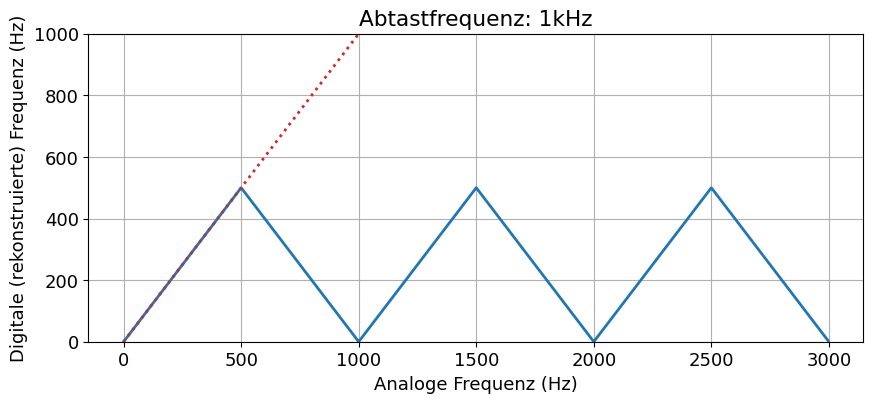

In [181]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal  # Importiere das Modul signal aus scipy

# Abtastparameter
fs = 1000  # Abtastfrequenz in Hz
t = np.linspace(0, 3, int(fs), endpoint=False)  # Zeitachse für 1 Sekunde

# Erzeugen des Dreiecksignals
frequency = 1  # Frequenz des Dreiecksignals in Hz
amplitude = 1.0  # Amplitude des Dreiecksignals
triangle_signal = 0.25 *( signal.sawtooth(2 * np.pi * frequency * t, width=0.5) +1)

# Plot der mehreren Schwingungen des Dreiecksignals
plt.figure(figsize=(10, 4))
plt.plot(1000*t, 1000*triangle_signal, lw=2, color = 'tab:blue')
plt.plot(1000*t, 1000*t, lw=2, color = 'tab:red', ls = ':')
plt.title('Abtastfrequenz: 1kHz')

plt.xlabel('Analoge Frequenz (Hz)')
plt.ylabel('Rekonstruierte Frequenz (Hz)')
plt.ylim([0,1000])
plt.grid(True)
plt.show()


Das heißt zu hohe Frequenzen im Messsignal, die das Nyquist-Shannon-Theorem verletzen, generieren neue Signalfrequenzen bei kleineren Werten, die eigentlich gar nicht dar sein sollten. Dies kann man am besten im Frequenzraum mittels Fourier-Transformation beobachten. 

Im Folgenden untersuchen wir zwei Sinussignale

$$u_1(t) = 4 \cdot \sin(2\pi \cdot 5\,\mathrm{Hz} \cdot t)$$

$$u_2(t) = 2 \cdot \sin(2\pi \cdot 50\,\mathrm{Hz} \cdot t)$$

die wir per Addition zu einem Signal kombinieren:

$$u(t) = u_1(t) + u_2(t)$$

und mit zwei verschiedenen Abtastfrequenzen digitalisieren. 

Mittels [Fourier-Transformation](3_FourierAnalyse) kann man sich die Leistung bei den Frequenzen berechnen lassen, die im Signal enthalten sind. Diese Darstellung ist im Folgenden rechts gezeigt: 

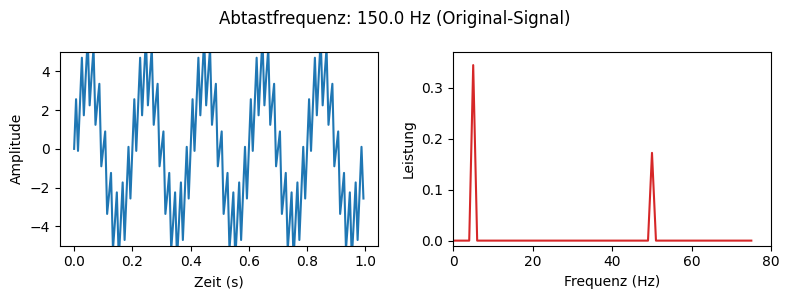

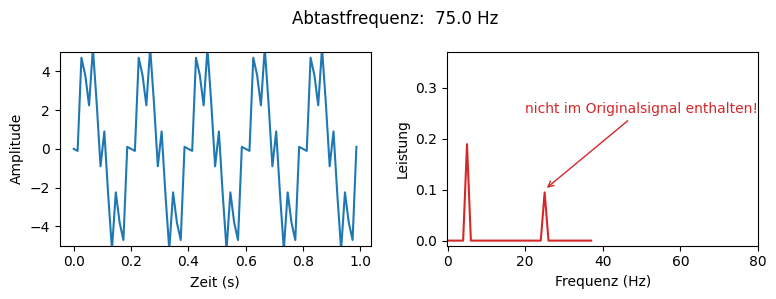

In [159]:
from scipy.fft import rfft, rfftfreq
from scipy.io.wavfile import read #import the required function from the module
import matplotlib.pyplot as plt
import numpy as np
# MatplotLib Settings:
plt.style.use('default') # Matplotlib Style wählen
#plt.xkcd()
plt.rcParams['font.size'] = 10; # Schriftgröße 

Fs = 150.0;  # sampling rate
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,1,Ts) # time vector
ff = 5;   # frequency of the signal
a1 = 4.
a2 = 2.
y =  a1 * np.sin(2 * np.pi * ff * t) + a2 * np.sin(10 * 2 * np.pi * ff * t)

y_normalized = np.int16((y / y.max()) * 32767)
yf = rfft(y_normalized)/5e6
xf = rfftfreq(len(y), 1 / Fs)

plt.figure(figsize=(8,3)) # Plot-Größe
plt.subplot(1,2,1)
plt.plot(t,y, 'tab:blue')
plt.xlabel('Zeit (s)')
plt.ylabel('Amplitude')
plt.ylim(-5,5)
plt.subplot(1,2,2)
plt.plot(xf,abs(yf),'tab:red') # plotting the spectrum
plt.xlabel('Frequenz (Hz)')
plt.ylabel('Leistung')
plt.ylim(-0.01,0.37)
plt.xlim(-0.1,80)
plt.suptitle(r'Abtastfrequenz: %5.1f Hz (Original-Signal)' %(Fs))
plt.tight_layout()
plt.show()

# Sampling frequenz: nur jedes n-te Element als Stichprobe aus dem Array rauspicken
n = 2
Fs_n = Fs/n
y_n = y[::n]
t_n = t[::n]

y_normalized = np.int16((y_n / y_n.max()) * 32767)
yf = rfft(y_normalized)/5e6
xf = rfftfreq(len(y_n), 1 / Fs_n)

plt.figure(figsize=(8,3)) # Plot-Größe
plt.subplot(1,2,1)
plt.plot(t_n,y_n, 'tab:blue')
plt.xlabel('Zeit (s)')
plt.ylabel('Amplitude')
plt.ylim(-5,5)
plt.subplot(1,2,2)
plt.plot(xf,abs(yf),'tab:red') # plotting the spectrum
plt.annotate('nicht im Originalsignal enthalten!', xy=(25, 0.1),
            xytext=(20, 0.25), color = 'tab:red',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3", color = 'tab:red')
            )
plt.xlabel('Frequenz (Hz)')
plt.ylabel('Leistung')
plt.ylim(-0.01,0.37)
plt.xlim(-0.1,80)
plt.suptitle(r'Abtastfrequenz: %5.1f Hz' %(Fs_n))
plt.tight_layout()
plt.show()

In den Diagrammen sieht man, dass bei der Wahl einer zu kleinen Abtastfrequenz ein Signal bei 25Hz auftritt, was im Originalsignal eigentlich gar nicht enthalten ist. Dies liegt daran, dass die gewählte Abtastfrequenz von 75Hz das Shannon-Nyquist-Theorem für das Signal bei ursprünglich 50Hz (100Hz Sampling benötigt) nicht erfüllt. 
Diese Frequenz wird zur halben Frequenz *runter-ge-aliased*. Das Signal bei 5Hz erfüllt das Theorem und wird nicht verändert. 
Außerdem erkennt man, dass die Signale nur noch die halbe Leistung aufweisen. Dies liegt an der Reduzierung der Abtastfrequenz um den Faktor 2.

Zur Vermeidung von Alisaing werden Filter verwendet, um hohe Frequenzen im Signal vor der Digitalisierung rauszufiltern, damit diese keine *Dreckeffekte* bei der Messung hinzufügen, die eigentlich gar nicht da sind. Bei diesen sogenannten **Anti-Aliasing-Filtern** handelt es sich um steile Tiefpass-Filter höherer Ordnung, um eine möglichst große Unterdrückung bei hohen Frequenzen zu erreichen. Das eigentliche, zu digitalisierende Signal sollte in seinem Frequenzverlauf jedoch möglichst nicht verändert werden durch den *Anti-Aliasing-Filter*. Daher muss man bei dem Filterdesign sehr vorsichtig sein. 

## Vorteile

Digitalisierte Messsignale haben den Vorteil, dass die Genauigkeit auch über große Distanzen erhalten bleiben und sie somit gut übertragen werden können. Außerdem ist die Weiterverarbeitung und Datenanalyse einfacher. 
Bei analogen Messsignalen hat man das Problem, dass äußere Störungen das Messsignal stark verändern können, wie z.B. Drift- oder Rauscheigenschaften von elektronischen Komponenten. 
Viele empfinden analoge Messwerte jedoch angenehmer und übersichtlicher, als Reihen von Zahlen auf dem Computer. 
Der wichtigste Vorteil von analogen Messwerten ist jedoch die große Bandbreite und großer Wertebereich und die simultane Verarbeitung. Gerade bei dynamischen Systemen kann dies ein großer Vorteil sein, wenn man sich schnell verändernde zeitliche Messgrößen hat. 